In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
from PIL import Image

In [2]:
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"]="true"
img_folder_path='C:\\Users\\Tom-G\\OneDrive\\3DOWN\\Bioinformatics\\Exp\\FCN\\ISBI_Dataset'

In [3]:
def load_dataset(img_folder_path):
    """
    Get all file names in the given dataset folder
    :param img_folder_path: dataset folder path
    :return: train and label image name tuple
    """
    os.chdir(img_folder_path)
    X_ids = next(os.walk('train'))[2]
    Y_ids = next(os.walk('label'))[2]
    print(len(X_ids), len(Y_ids))
    X_ids.sort()
    Y_ids.sort()
    return X_ids, Y_ids


def vertical_symmetry(img_input):
    return np.array(img_input)[::-1, :, :]


def horizontal_symmetry(img_input):
    return np.array(img_input)[:, ::-1, :]


def vertical_symmetry_2D(img_input):
    return np.array(img_input)[::-1, :]


def horizontal_symmetry_2D(img_input):
    return np.array(img_input)[:, ::-1]


def cropping(img_input):
    return img_input.crop((0, 0, img_input.width / 2, img_input.height / 2)), img_input.crop(
        (0, img_input.height / 2 - 1, img_input.width / 2, img_input.height - 1)), img_input.crop(
        (img_input.width / 2 - 1, 0, img_input.width - 1, img_input.height / 2 - 1)), img_input.crop(
        (img_input.width / 2 - 1, img_input.height / 2 - 1, img_input.width - 1, img_input.height - 1))


IMG_CHANNELS, IMG_WIDTH, IMG_HEIGHT = 3, 512, 512


def generate_train_image(img_folder_path, file_size):
    X_ids, Y_ids = load_dataset(img_folder_path)
    X_train = np.zeros((len(X_ids) * 7, file_size, file_size, 3), dtype=np.float32)
    Y_train = np.zeros((len(Y_ids) * 7, file_size, file_size, 1), dtype=np.bool)
    X_original = np.zeros((len(X_ids), 2 * file_size, 2 * file_size, 3), dtype=np.float32)
    Y_original = np.zeros((len(Y_ids), 2 * file_size, 2 * file_size, 1), dtype=np.float32)
    n = 0
    m = 0
    for id_ in X_ids:
        image = tf.keras.preprocessing.image.load_img(f'{img_folder_path}/train/{id_}',
                                                      target_size=(IMG_HEIGHT, IMG_WIDTH))
        # print(n,id_)
        input_arr = tf.keras.preprocessing.image.img_to_array(image)[90:450, 150:406]
        image = tf.keras.preprocessing.image.array_to_img(input_arr, ).resize((file_size, file_size))
        original_image = tf.keras.preprocessing.image.array_to_img(input_arr, ).resize((2 * file_size, 2 * file_size))
        X_train[n] = np.array(image)
        X_original[m] = np.array(original_image)
        img1, img2, img3, img4 = cropping(tf.keras.preprocessing.image.array_to_img(X_original[m]))
        n += 1
        X_train[n] = np.array(img1.resize((file_size, file_size)))
        n += 1
        X_train[n] = np.array(img2.resize((file_size, file_size)))
        n += 1
        X_train[n] = np.array(img3.resize((file_size, file_size)))
        n += 1
        X_train[n] = np.array(img4.resize((file_size, file_size)))
        n += 1
        X_train[n] = np.array(tf.keras.preprocessing.image.array_to_img(
            vertical_symmetry(tf.keras.preprocessing.image.array_to_img(X_train[m])), ).resize(
            (file_size, file_size)))
        n += 1
        X_train[n] = np.array(tf.keras.preprocessing.image.array_to_img(
            horizontal_symmetry(tf.keras.preprocessing.image.array_to_img(X_train[m])), ).resize(
            (file_size, file_size)))
        n += 1
        m += 1

    n = 0
    m = 0
    for id_ in Y_ids:
        image = tf.keras.preprocessing.image.load_img(f'{img_folder_path}/label/{id_}',
                                                      target_size=(IMG_HEIGHT, IMG_WIDTH), color_mode="grayscale")

        # print(n, id_)
        input_arr = tf.keras.preprocessing.image.img_to_array(image)[90:450, 150:406]
        image = tf.keras.preprocessing.image.array_to_img(input_arr, ).resize((file_size, file_size))
        original_image = tf.keras.preprocessing.image.array_to_img(input_arr, ).resize((2 * file_size, 2 * file_size))
        Y_train[n] = np.array(image)[:, :, np.newaxis]
        Y_original[m] = np.array(original_image)[:, :, np.newaxis]

        img1, img2, img3, img4 = cropping(tf.keras.preprocessing.image.array_to_img(Y_original[m]))
        n += 1
        Y_train[n] = np.array(img1.resize((file_size, file_size)))[:, :, np.newaxis]
        n += 1
        Y_train[n] = np.array(img2.resize((file_size, file_size)))[:, :, np.newaxis]
        n += 1
        Y_train[n] = np.array(img3.resize((file_size, file_size)))[:, :, np.newaxis]
        n += 1
        Y_train[n] = np.array(img4.resize((file_size, file_size)))[:, :, np.newaxis]
        n += 1
        Y_train[n] = np.array(vertical_symmetry_2D(tf.keras.preprocessing.image.array_to_img(Y_train[m])), )[:, :,
                     np.newaxis]
        n += 1
        Y_train[n] = np.array(horizontal_symmetry_2D(tf.keras.preprocessing.image.array_to_img(Y_train[m])), )[:, :,
                     np.newaxis]
        n += 1
        m += 1
    pic = Y_train[0][:, :, 0]
    plt.imshow(pic)
    return X_train, Y_train


def draw_img(no, X_train, Y_train):
    ax1 = plt.subplot(121)
    ax1.imshow(tf.keras.preprocessing.image.array_to_img(X_train[no]))
    ax2 = plt.subplot(122)
    ax2.imshow(tf.keras.preprocessing.image.array_to_img(Y_train[no]))
    plt.show()


30 30
30 30


D:\Env\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:45: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


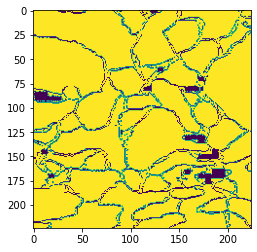

In [4]:
def map_y_train(Y_train, file_size, Y_ids):
    real_Y_train = np.zeros((len(Y_ids) * 7, file_size, file_size, 1), dtype=np.float32)
    count = 0;
    for item in Y_train:
        mask = item[:, :, 0]
        for length in range(0, file_size):
            for height in range(0, file_size):
                if mask[length][height]:
                    real_Y_train[count][length][height] = 0
                else:
                    real_Y_train[count][length][height] = 1
        count+=1
    return real_Y_train

X_ids,Y_ids=load_dataset(img_folder_path)
X_train,Y_train=generate_train_image(img_folder_path, 224)
test=map_y_train(Y_train,224,Y_ids)



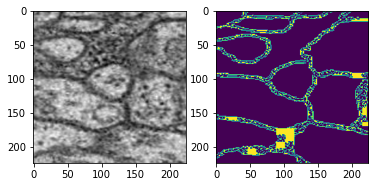

In [5]:
draw_img(58,X_train,test)

In [6]:
import tensorflow as tf


class FCN8s(tf.keras.Model):
    def __init__(self, n_class=2):
        super(FCN8s, self).__init__()
        # conv1
        self.conv1_1 = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='valid')
        self.conv1_2 = tf.keras.layers.Conv2D(64, 3, activation='relu', padding='same')
        self.pool1 = tf.keras.layers.MaxPooling2D(2, strides=2, padding='same')  # 1/2

        # conv2
        self.conv2_1 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')
        self.conv2_2 = tf.keras.layers.Conv2D(128, 3, activation='relu', padding='same')
        self.pool2 = tf.keras.layers.MaxPooling2D(2, strides=2, padding='same')  # 1/4

        # conv3
        self.conv3_1 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')
        self.conv3_2 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')
        self.conv3_3 = tf.keras.layers.Conv2D(256, 3, activation='relu', padding='same')
        self.pool3 = tf.keras.layers.MaxPooling2D(2, strides=2, padding='same')  # 1/8

        # conv4
        self.conv4_1 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')
        self.conv4_2 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')
        self.conv4_3 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')
        self.pool4 = tf.keras.layers.MaxPooling2D(2, strides=2, padding='same')  # 1/16

        # conv5
        self.conv5_1 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')
        self.conv5_2 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')
        self.conv5_3 = tf.keras.layers.Conv2D(512, 3, activation='relu', padding='same')
        self.pool5 = tf.keras.layers.MaxPooling2D(2, strides=2, padding='same')  # 1/32

        # fc6
        self.fc6 = tf.keras.layers.Conv2D(4096, 7, activation='relu', padding='valid')
        self.drop6 = tf.keras.layers.Dropout(0.5)

        # fc7
        self.fc7 = tf.keras.layers.Conv2D(4096, 1, activation='relu', padding='valid')
        self.drop7 = tf.keras.layers.Dropout(0.5)

        self.socre_fr = tf.keras.layers.Conv2D(n_class, 1)
        self.score_pool3 = tf.keras.layers.Conv2D(n_class, 1)
        self.score_pool4 = tf.keras.layers.Conv2D(n_class, 1)

        self.upscore2 = tf.keras.layers.Conv2DTranspose(
            n_class, 4, strides=2, padding='valid', use_bias=False)
        self.upscore8 = tf.keras.layers.Conv2DTranspose(
            n_class, 16, strides=8, padding='valid', use_bias=False)
        self.upscore_pool4 = tf.keras.layers.Conv2DTranspose(
            n_class, 4, strides=2, padding='valid', use_bias=False)

    def call(self, x, training=False):
        h = x
        h = self.conv1_1(tf.keras.layers.ZeroPadding2D(padding=(100, 100))(h))
        h = self.conv1_2(h)
        h = self.pool1(h)

        h = self.conv2_1(h)
        h = self.conv2_2(h)
        h = self.pool2(h)

        h = self.conv3_1(h)
        h = self.conv3_2(h)
        h = self.conv3_3(h)
        h = self.pool3(h)
        pool3 = h  # 1/8

        h = self.conv4_1(h)
        h = self.conv4_2(h)
        h = self.conv4_3(h)
        h = self.pool4(h)
        pool4 = h  # 1/16

        h = self.conv5_1(h)
        h = self.conv5_2(h)
        h = self.conv5_3(h)
        h = self.pool5(h)

        h = self.fc6(h)
        h = self.drop6(h, training)

        h = self.fc7(h)
        h = self.drop7(h, training)

        h = self.socre_fr(h)
        h = self.upscore2(h)
        upscore2 = h  # 1/16
        # print(upscore2.shape)

        h = self.score_pool4(pool4 * 0.01)  # XXX: scaling to train at onece
        h = h[:, 5:5 + upscore2.shape[1], 5:5 + upscore2.shape[2], :]  # channel last
        score_pool4c = h  # 1/16

        h = upscore2 + score_pool4c  # 1/16
        h = self.upscore_pool4(h)
        upscore_pool4 = h  # 1/8

        h = self.score_pool3(pool3 * 0.0001)  # XXX: scaling to train at onece
        h = h[:,
            9:9 + upscore_pool4.shape[1],
            9:9 + upscore_pool4.shape[2], :]  # channel last
        score_pool3c = h  # 1/8

        h = upscore_pool4 + score_pool3c  # 1/8

        h = self.upscore8(h)
        h = h[:, 31:31 + x.shape[1], 31:31 + x.shape[2], :]  # channel last

        return tf.nn.softmax(h, axis=-1)


30 30
30 30


D:\Env\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:45: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


Epoch 1/1000
95/95 [==============================] - 51s 444ms/step - loss: 0.6794 - accuracy: 0.5531 - val_loss: 0.5591 - val_accuracy: 0.7212

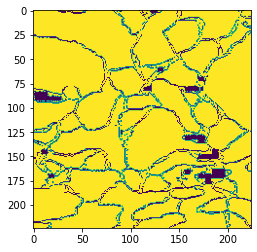

In [7]:
model = FCN8s(n_class=2)

model.compile(optimizer=tf.keras.optimizers.Adam(lr=1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
# model.summary()
img_folder_path = img_folder_path
X_ids,Y_ids=load_dataset(img_folder_path)
X_train, Y_train = generate_train_image(img_folder_path, file_size=224)
test=map_y_train(Y_train,224,Y_ids)
callback = tf.keras.callbacks.ModelCheckpoint("FCN8sAlter.h5", verbose=2, save_weights_only=True)
results = model.fit(X_train, test, epochs=1000, validation_split=0.1, callbacks=[callback], batch_size=2)

In [8]:
def draw_data(results):
    plt.plot(results.history['accuracy'])
    plt.plot(results.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # summarize history for loss
    plt.plot(results.history['loss'])
    plt.plot(results.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

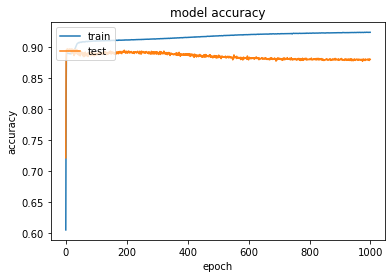

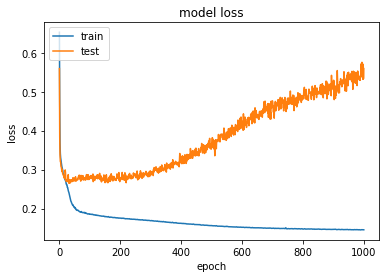

30 30
train-volume03.jpg
(224, 224, 2)
(224, 224, 3)


D:\Env\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:21: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


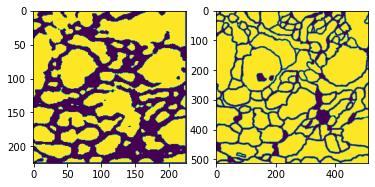

In [11]:
draw_data(results)
import random
X_ids, Y_ids = load_dataset(img_folder_path)
test_id = random.choice(X_ids)
print(test_id)
img = tf.keras.preprocessing.image.load_img(f"{img_folder_path}/train/{test_id}", target_size=(224, 224))
input_array = tf.keras.preprocessing.image.img_to_array(img)
input_array_model = np.array([input_array])
predictions = model.predict(input_array_model)
alter=np.zeros(shape=(224,224,2))
alter[:,:,:]=predictions[0,:,:,:]
print(alter.shape)
padding=np.zeros(shape=(224,224,1))
new=np.c_[alter,padding]
print(new.shape)
# for  i in alter:
#   print(i.shape)
#   for j in i:
#     if(j[1]<0.9):
#       print(j)
pic=np.zeros((225,225),dtype=np.int)
m=0
n=0
for i in alter:
  for j in i:
    if(j[1]<0.005):
      pic[n][m]=1
    m+=1
  n+=1
  m=0
ax12=plt.subplot(121)
ax12.imshow(pic)
ax13=plt.subplot(122)
train_id=test_id.replace('volume','labels')
ax13.imshow(np.asarray(Image.open(f"{img_folder_path}/label/{train_id}")))
plt.show()